# E1
## T1.1
ProductName:    	macOS
ProductVersion:    	15.0.1
BuildVersion:    	24A348
Darwin Mac 24.0.0 Darwin Kernel Version 24.0.0: Tue Sep 24 23:37:13 PDT 2024; root:xnu-11215.1.12~1/RELEASE_ARM64_T8112 arm64

time.time: 7.152557373046875e-07
timeit.default_timer: 8.297502063214779e-08
time.time_ns: 768.0


In [32]:
import numpy as np
import time
import timeit


def checktick(timestampFunction):
    M = 200
    timesfound = np.empty((M,))
    for i in range(M):
        t1 = timestampFunction()  # get timestamp from timer
        t2 = timestampFunction()  # get timestamp from timer
        while (
            t2 - t1
        ) < 1e-16:  # if zero then we are below clock granularity, retake timing
            t2 = timestampFunction()  # get timestamp from timer
        t1 = t2  # this is outside the loop
        timesfound[i] = t1  # record the time stamp
    minDelta = 1000000
    Delta = np.diff(timesfound)  # it should be cast to int only when needed
    minDelta = Delta.min()
    return minDelta


def main():
    print(checktick(time.time))
    print(checktick(timeit.default_timer))
    print(checktick(time.time_ns))


if __name__ == "__main__":
    main()


7.152557373046875e-07
2.079978003166616e-07
768.0


## T1.2

With the JuliaSet.py using our own made decorator.py

Results for computer with core speed of 4.05 GHz (assumed):
Function: calculate_z_serial_purepython
  Average Execution Time: 2.619 seconds
  Average Standard Deviation: 0.0103 seconds
Function: calc_pure_python
  Average Execution Time: 2.811 seconds
  Average Standard Deviation: 0.0215 seconds

With a clock frequency of about 4.05 GHz, a single cycle is about 0.25ns which is vastly smaller than both standard deviations (as they have 10.3 ms and 21.5 ms respectively). This means the amount of cycles must differ between each run or other programmes take up cycles on the system when running the code.

It might as well be the case that the OS decides to not use the performance cores in the CPU. These have a lower clock frequency of 2.75 GHz which results in the per cycle time of 0.36ns. This is still magnitudes smaller than the standard deviation of 10.3 ms and 21.5 ms of the average standard deviations. The kernel thread scheduling could allocate varying amounts of CPU time to each thread, contributing to the observed variation in execution times.


In [33]:
import timeit
from functools import wraps
from typing import Callable
import numpy as np


def timer(func: Callable) -> Callable:
    @wraps(func)
    def wrapper(*args, **kwargs):
        arr = np.zeros((10,))
        result = None
        for n in range(10):
            start = timeit.default_timer()
            result = func(*args, **kwargs)
            end = timeit.default_timer()
            arr[n] = end - start
        print(f"Function: {func.__name__}")
        print(f"Average Execution Time: {arr.mean():.6f} seconds")
        print(f"Standard Deviation: {arr.std():.6f} seconds")
        return result

    return wrapper


## T1.3
Using the cprofile command:

In [34]:
python3 -m cProfile -s cumulative JuliaSet.py

SyntaxError: invalid syntax (3693077235.py, line 1)

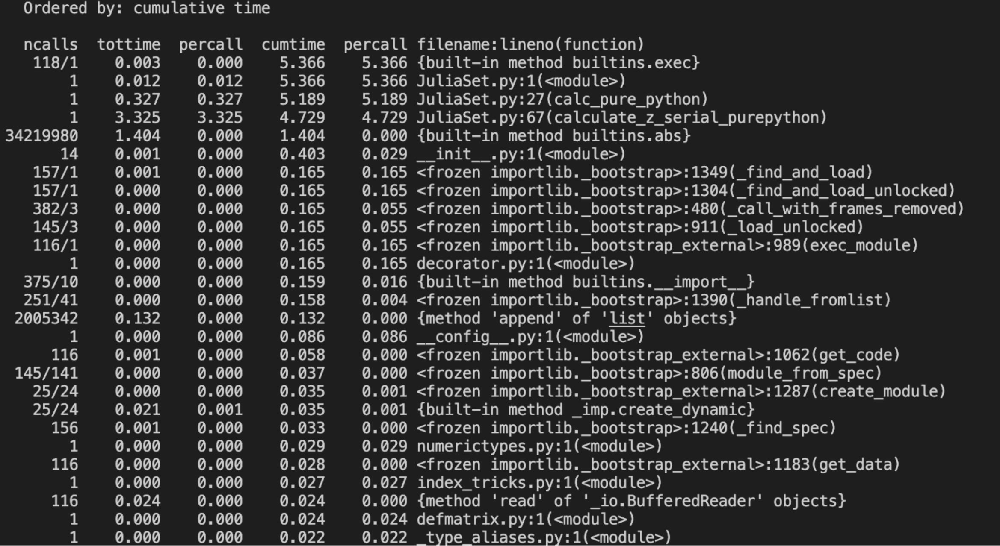

In [35]:
from IPython.display import Image
image_path = "./t13resultat.png"
Image(filename=image_path)

cProfile is showing results higher than the built decorator because of the fact that it has a lot more overhead done than the decorator. It also differentiates calc_pure_python from calculate_z_serial_purepython part which means it does not include it in the first function in cProfile while the decorator includes both. This makes cProfile include more overhead but is as well more informative than the decorator.

Using the command:

In [36]:
python3 -m kernprof -l JuliaSet.py

SyntaxError: invalid syntax (1119685662.py, line 1)

The results with line profiler becomes:

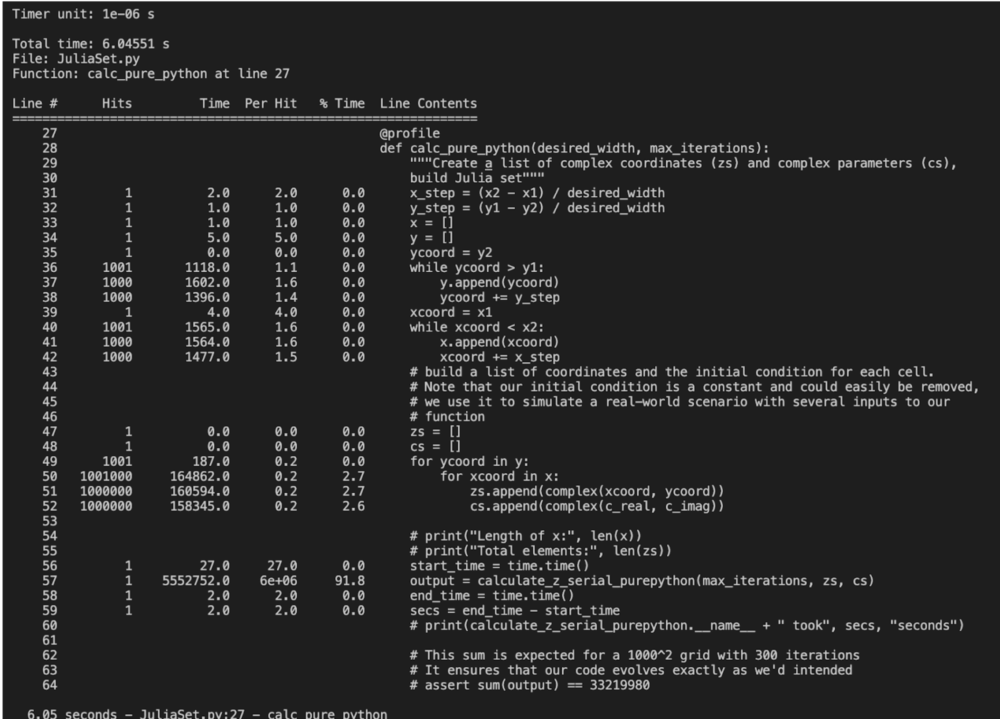

In [37]:
from IPython.display import Image
image_path = "./t13lineprof1.png"
Image(filename=image_path)

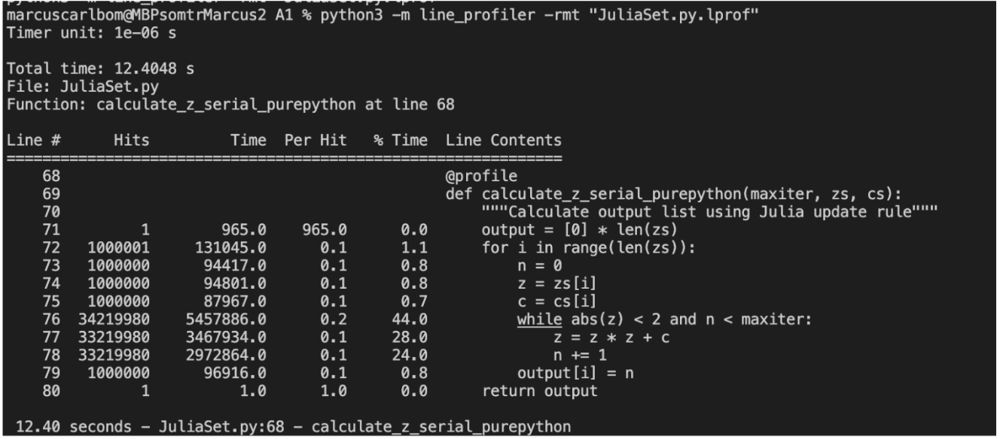

In [38]:
from IPython.display import Image
image_path = "./t13lineprof2.png"
Image(filename=image_path)

Snakeviz visualisation

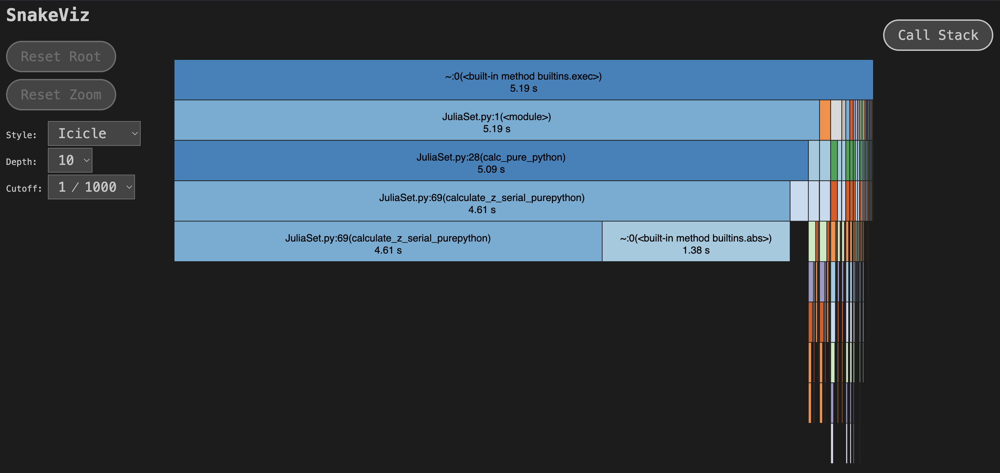

In [39]:
from IPython.display import Image
image_path = "./snakeviz.png"
Image(filename=image_path)

Measurements of overhead shows that running JuliaSet.py 5 times has an average run time of 2.325 seconds. With cProfiler, this becomes 5.088 seconds which is 2.763 more than without and is about an 219% increase in run-time. Running JuliaSet.py with line_profiler(@profile not being commented out) took on average 26.15 seconds, about 23.825 seconds extra overhead which is about 11247% increase in run-time. THis was done by implementing a start timer before and after calling the function in main of JuliaSet.py and as this is outside the clock granularity can this be seen as representative results.

## T1.4

Results from running:

In [ ]:
python3 -m memory_profiler JuliaSet.py

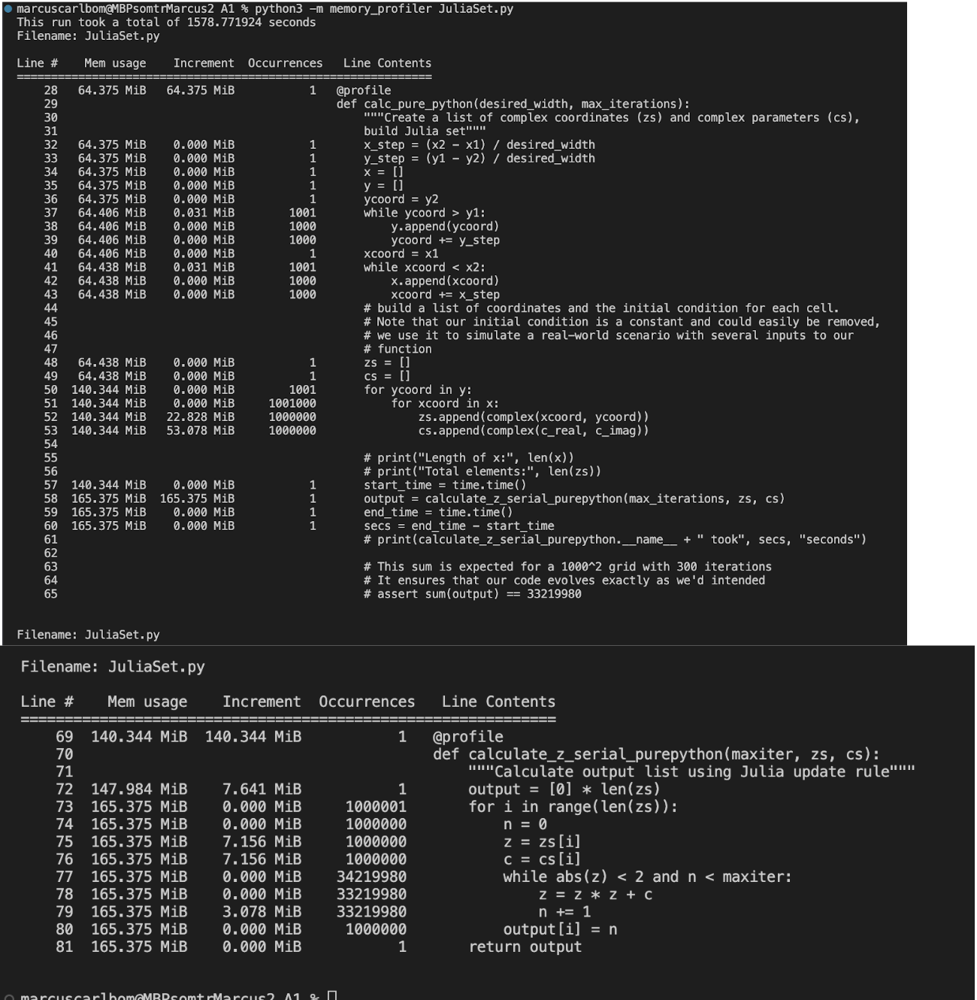

In [24]:
from IPython.display import Image
image_path = "./t14memory.png"
Image(filename=image_path)

Running the memory profiler just 1 time took 1578.77 seconds. This is an increase of 1576.445 seconds which is about 679 times longer run time than runnig the code without it.

Results from mprof plotting by using the given command:

In [ ]:
python3 -m mprof run JuliaSet.py

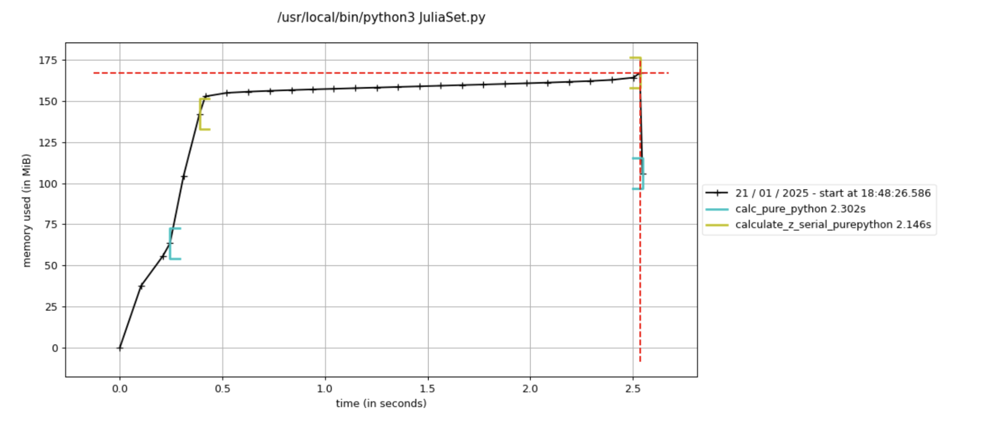

In [25]:
from IPython.display import Image
image_path = "./t14mprof.png"
Image(filename=image_path)

Took on average after 5 runs 2.337 seconds. This is an increase of 0.002 seconds which is about an 0.5% increase in run time. Which due to there being deviations means it is likely having close to negligible impact on run time.

### E2
## T2.1

Diffusion code (including profiler from bonus exercise)

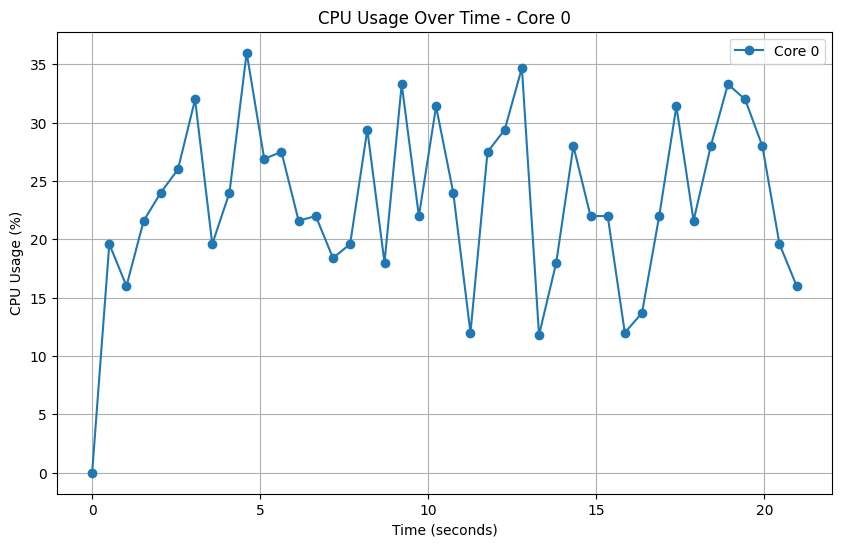

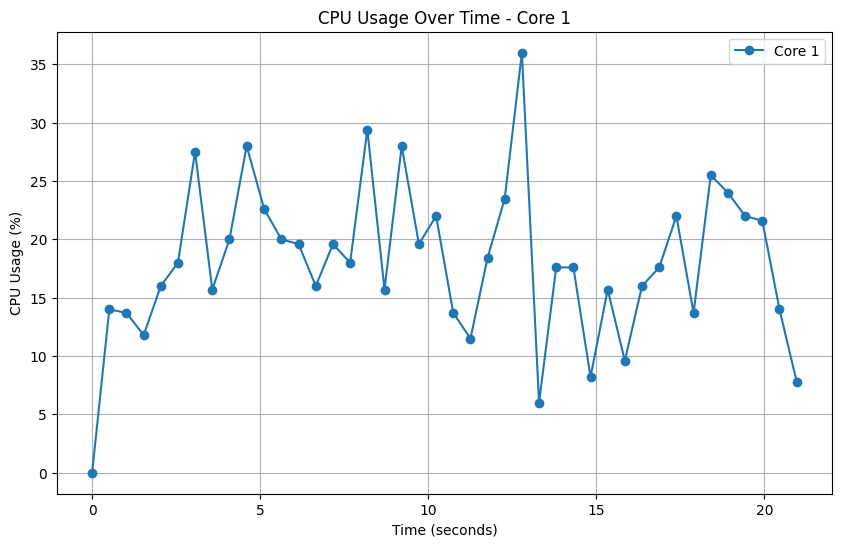

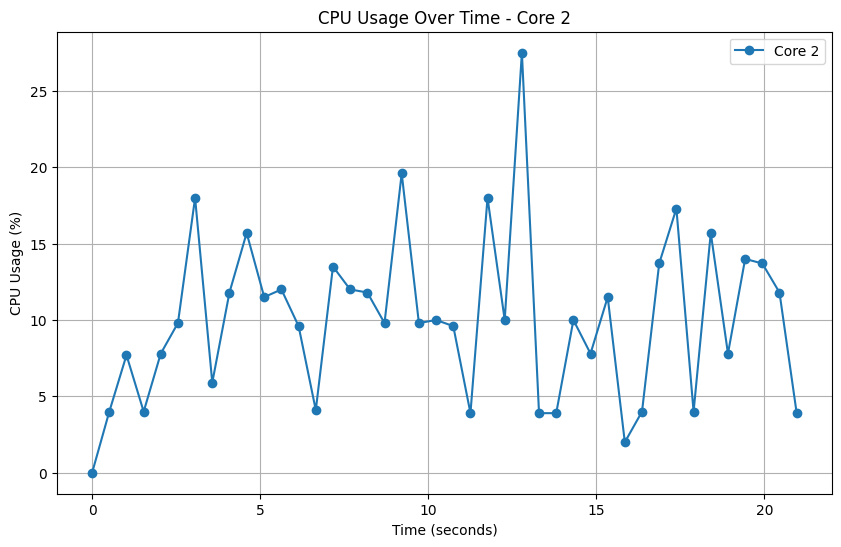

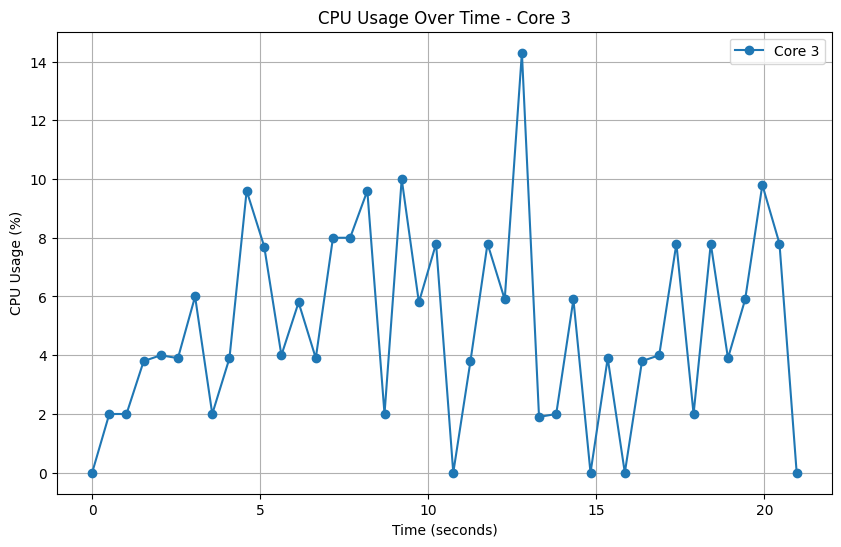

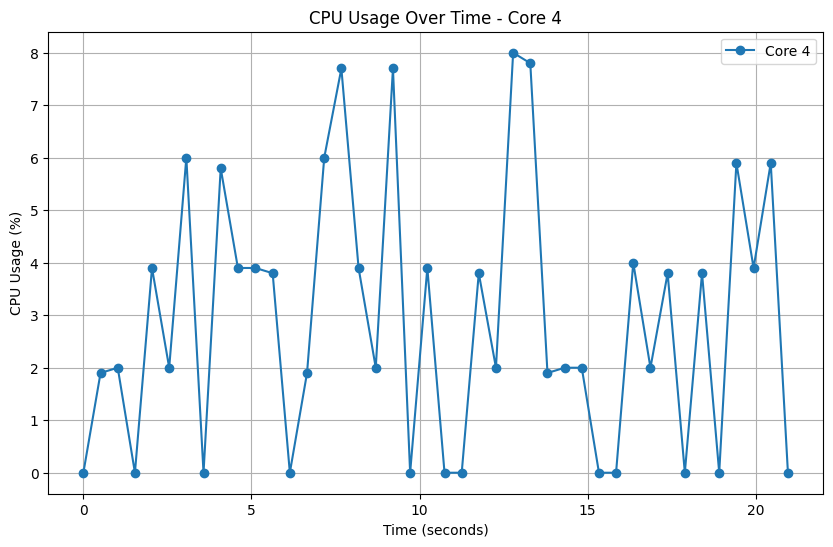

...

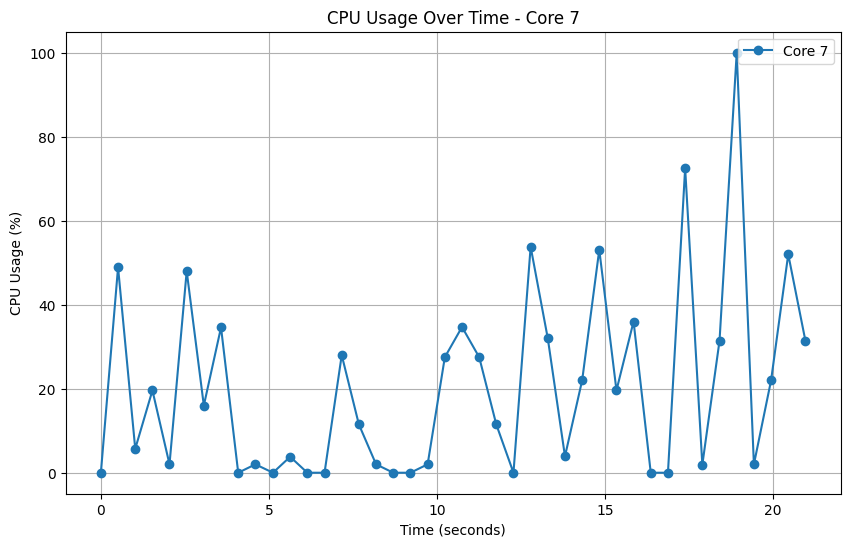

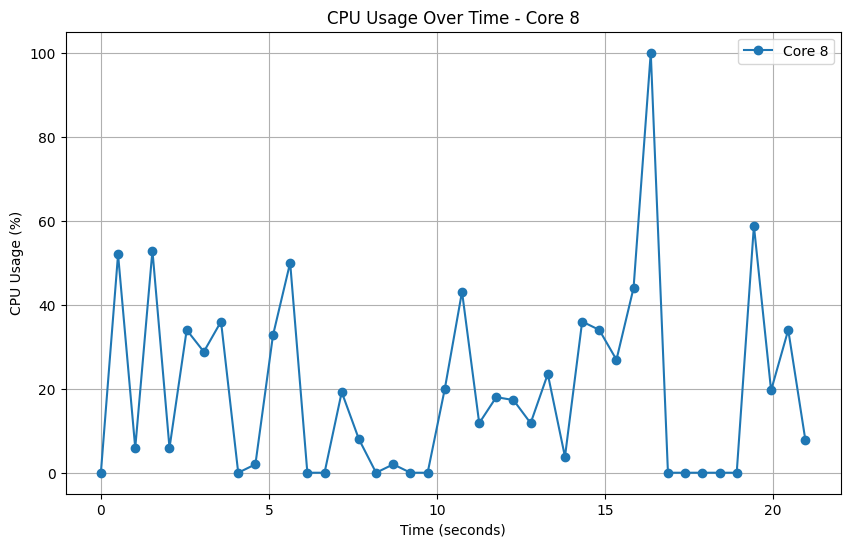

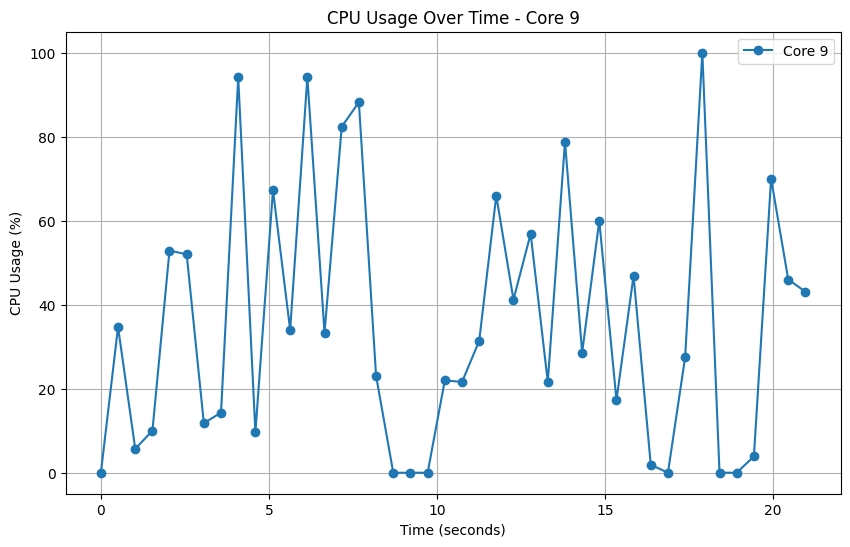

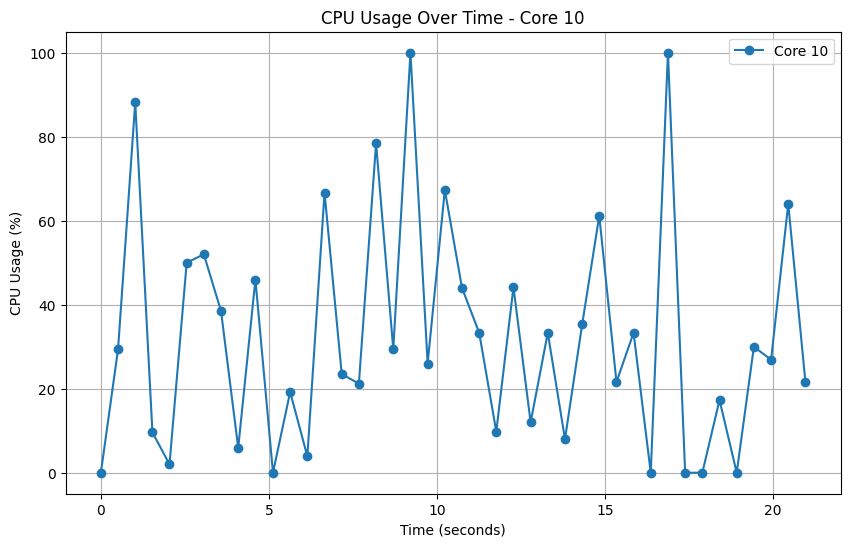

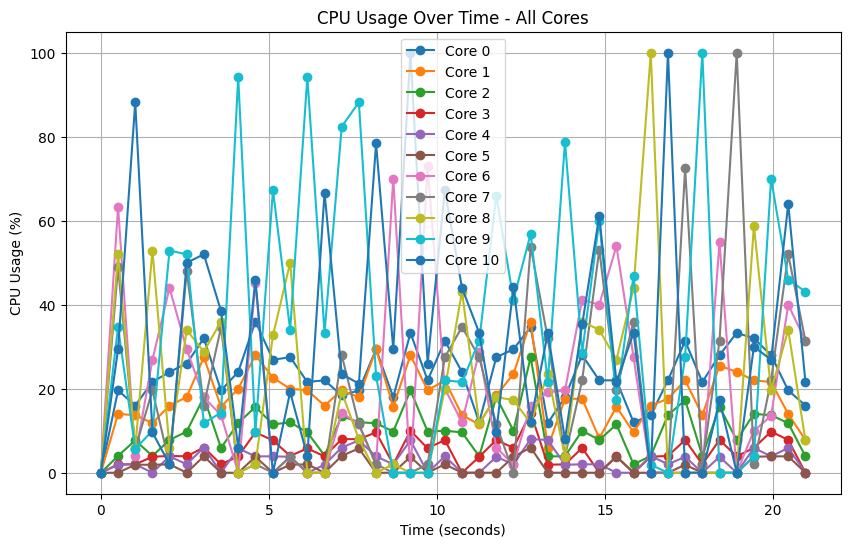

+---------+-------------+-------------+-------------+------------------+
| Core    | Avg Usage   | Max Usage   | Deviation   | Time above 50%   |
+=========+=============+=============+=============+==================+
| Core 0  | 23.24%      | 36.00%      | 7.32%       | 0.00%            |
+---------+-------------+-------------+-------------+------------------+
| Core 1  | 18.03%      | 36.00%      | 6.73%       | 0.00%            |
+---------+-------------+-------------+-------------+------------------+
| Core 2  | 10.06%      | 27.50%      | 5.46%       | 0.00%            |
+---------+-------------+-------------+-------------+------------------+
| Core 3  | 4.95%       | 14.30%      | 3.27%       | 0.00%            |
+---------+-------------+-------------+-------------+------------------+
| Core 4  | 2.93%       | 8.00%       | 2.50%       | 0.00%            |
+---------+-------------+-------------+-------------+------------------+
| Core 5  | 1.43%       | 6.00%       | 1.85%      

In [40]:
from B.profiler import ProProfiler
grid_shape = (640, 640)


# @profile
def evolve(grid, dt, D=1.0):
    xmax, ymax = grid_shape
    new_grid = [[0.0] * ymax for x in range(xmax)]
    for i in range(xmax):
        for j in range(ymax):
            grid_xx = (
                grid[(i + 1) % xmax][j] + grid[(i - 1) % xmax][j] - 2.0 * grid[i][j]
            )
            grid_yy = (
                grid[i][(j + 1) % ymax] + grid[i][(j - 1) % ymax] - 2.0 * grid[i][j]
            )
            new_grid[i][j] = grid[i][j] + D * (grid_xx + grid_yy) * dt
    return new_grid


# @profile
def run_experiment(num_iterations):
    # Setting up initial conditions 
    xmax, ymax = grid_shape
    grid = [[0.0] * ymax for x in range(xmax)]

    # These initial conditions are simulating a drop of dye in the middle of our
    # simulated region
    block_low = int(grid_shape[0] * 0.4)
    block_high = int(grid_shape[0] * 0.5)
    for i in range(block_low, block_high):
        for j in range(block_low, block_high):
            grid[i][j] = 0.005

    # Evolve the initial conditions
    for i in range(num_iterations):
        grid = evolve(grid, 0.1)


if __name__ == "__main__":
    with ProProfiler(0.5) as profiler:
        num_of_iterations = 300
        run_experiment(num_of_iterations)
    
    profiler.plot()
    profiler.summary_table()



Results of cProfile snakeViz

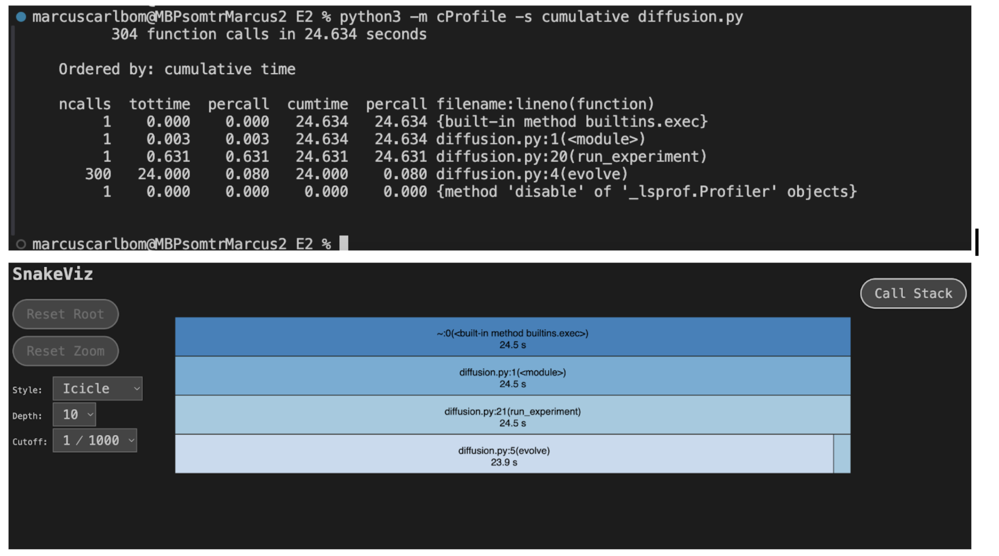

In [26]:
from IPython.display import Image
image_path = "./t21cprofile.png"
Image(filename=image_path)

In [ ]:
Results of line_profiler

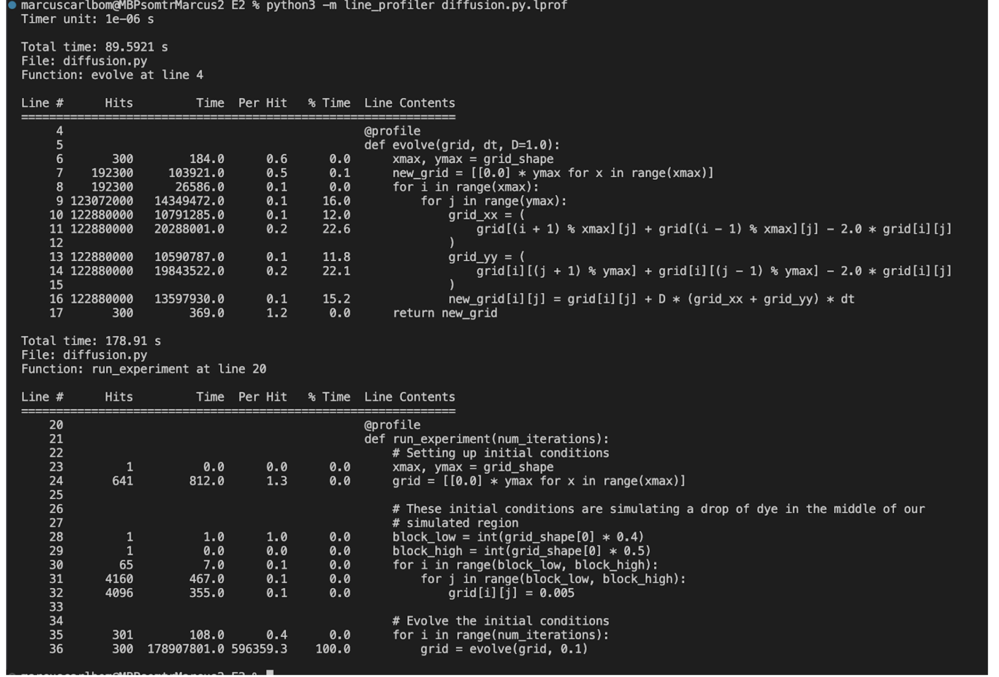

In [27]:
from IPython.display import Image
image_path = "./t21lineprofile.png"
Image(filename=image_path)

memory_profiler run for diffusion.py

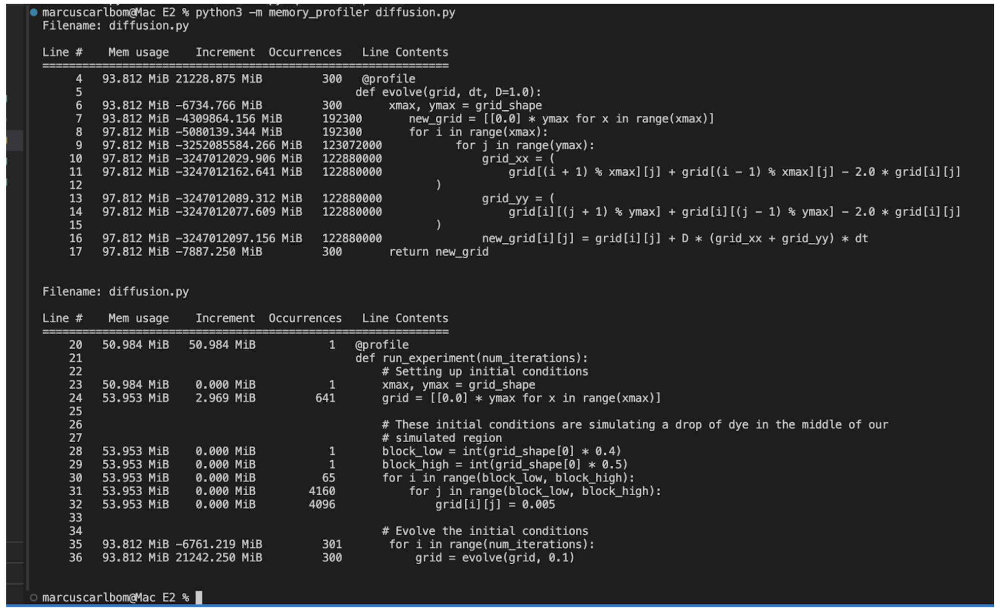

In [28]:
from IPython.display import Image
image_path = "./t22memoryprofile.png"
Image(filename=image_path)

mprof plotting:

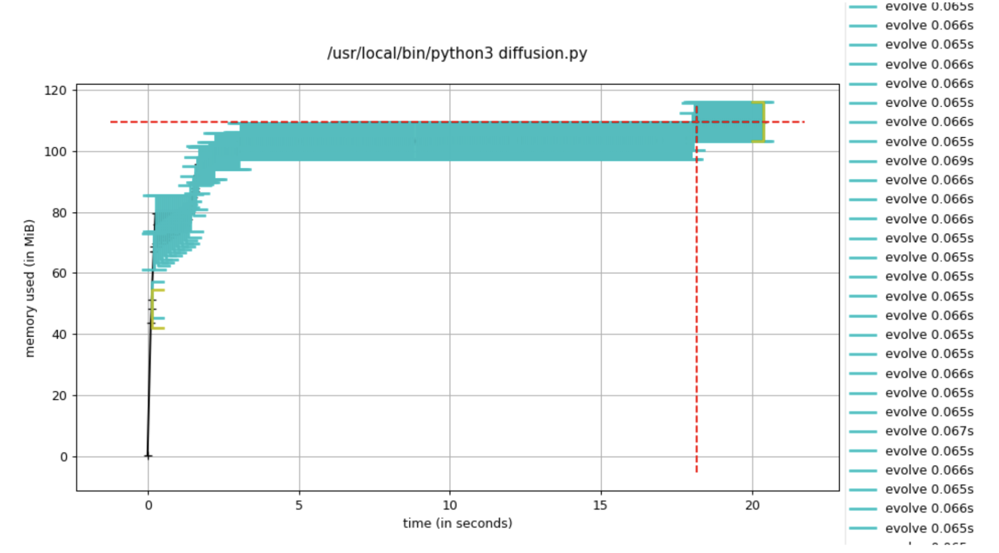

In [29]:
from IPython.display import Image
image_path = "./t22mprof.png"
Image(filename=image_path)

### Bonus Exercise
We made a special class in Python to make it easy to call *with*-statement and the wanted interval in seconds. We wanted it to not interfere with the running code so we made a secondary thread using the module “threading” as making that thread sleep was a simple way to handle periodic check of the core usage percentage. 

It takes periodic check and saves it to a list called samples. When the *with*-statement is finished, the \__exit\__ function ends (joins) the thread and makes it possible for calling profiler.plot() and profiler.summary_table() to view the plot of the data and summary table. We did not include minimum values in the summary table as they always had in our tests a value of 0% on each core. The plot() first creates graphs for each respective core and then a combined graph with all of the core percentages over time. We decided to only include the combined graph as the computer used has 11 cores, an unnecessary amount of screenshots.

Profiler is as seen below


In [41]:
import timeit
import time
import psutil
import numpy as np
import matplotlib.pyplot as plt
import threading
import tabulate as tb


class ProProfiler:

    def __init__(self, interval=0.5): 
        self.start_time = None
        self.interval = interval
        self.samples = []
        self._thread = None
        self._thead_stop_event = threading.Event()
        
    def __enter__(self):
        self.samples = []
        self.start_time = timeit.default_timer()
        psutil.cpu_percent(percpu=True)
        self._thead_stop_event.clear()
        self._thread = threading.Thread(target=self.cpu_usage)
        self._thread.start()
        return self
        
    def __exit__(self, exc_type, exc_value, traceback):
        self._thead_stop_event.set()
        self._thread.join()
        
    def cpu_usage(self):
        while not self._thead_stop_event.is_set():
            timestamp = timeit.default_timer() - self.start_time
            cpu_percentage = psutil.cpu_percent(interval=0, percpu=True)
            self.samples.append((timestamp, cpu_percentage))
            time.sleep(self.interval)

    def plot(self):
        timestamps = [sample[0] for sample in self.samples]
        cpu_data = [sample[1] for sample in self.samples]

        # Transpose to get per-core data
        core_data = np.array(cpu_data).T

        num_cores = core_data.shape[0]
        for i in range(num_cores):
            plt.figure(figsize=(10, 6))
            plt.plot(timestamps, core_data[i], label=f"Core {i}", marker='o')
            
            plt.title(f"CPU Usage Over Time - Core {i}")
            plt.xlabel("Time (seconds)")
            plt.ylabel("CPU Usage (%)")
            plt.legend()
            plt.grid(True)

            plt.show()

        plt.figure(figsize=(10, 6))
        for i in range(num_cores):
            plt.plot(timestamps, core_data[i], label=f"Core {i}", marker='o')

        plt.title("CPU Usage Over Time - All Cores")
        plt.xlabel("Time (seconds)")
        plt.ylabel("CPU Usage (%)")
        plt.legend()
        plt.grid(True)

        plt.show()

    def summary_table(self):
        cpu_data = [sample[1] for sample in self.samples]

        core_data = np.array(cpu_data).T

        table_data = []
        for i, core in enumerate(core_data):
            min_val = np.min(core)
            avg_val = np.mean(core)
            std_val = np.std(core)
            max_val = np.max(core)
            time_above_50 = np.sum(core > 50) / len(core) * 100
            table_data.append([f"Core {i}", f"{avg_val:.2f}%", f"{max_val:.2f}%", f"{std_val:.2f}%", f"{time_above_50:.2f}%"])

        headers = ["Core", "Avg Usage", "Max Usage", "Deviation", "Time above 50%"]
        print(tb.tabulate(table_data, headers=headers, tablefmt="grid"))

Results of running JuliaSet code with our own profiler tool at interval 0.1

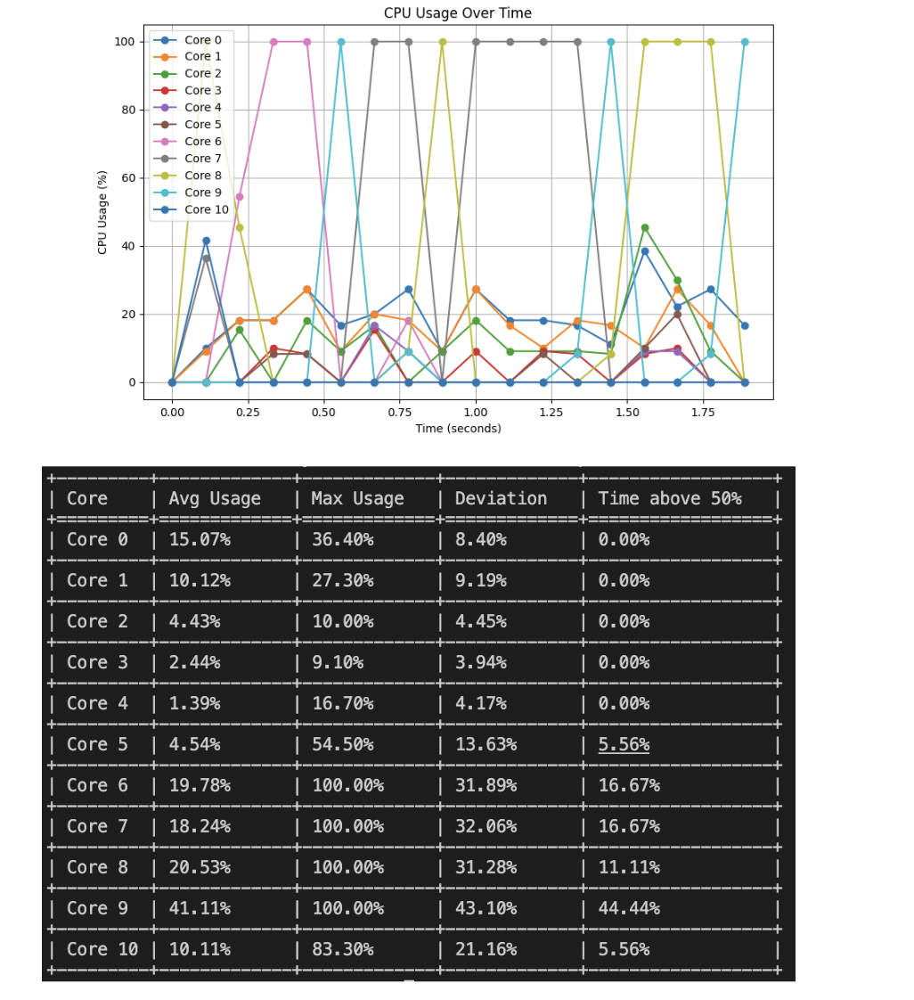

In [30]:
from IPython.display import Image
image_path = "./bonus1.png"
Image(filename=image_path)

Results of running diffusion code with our own profiler tool at interval 0.5

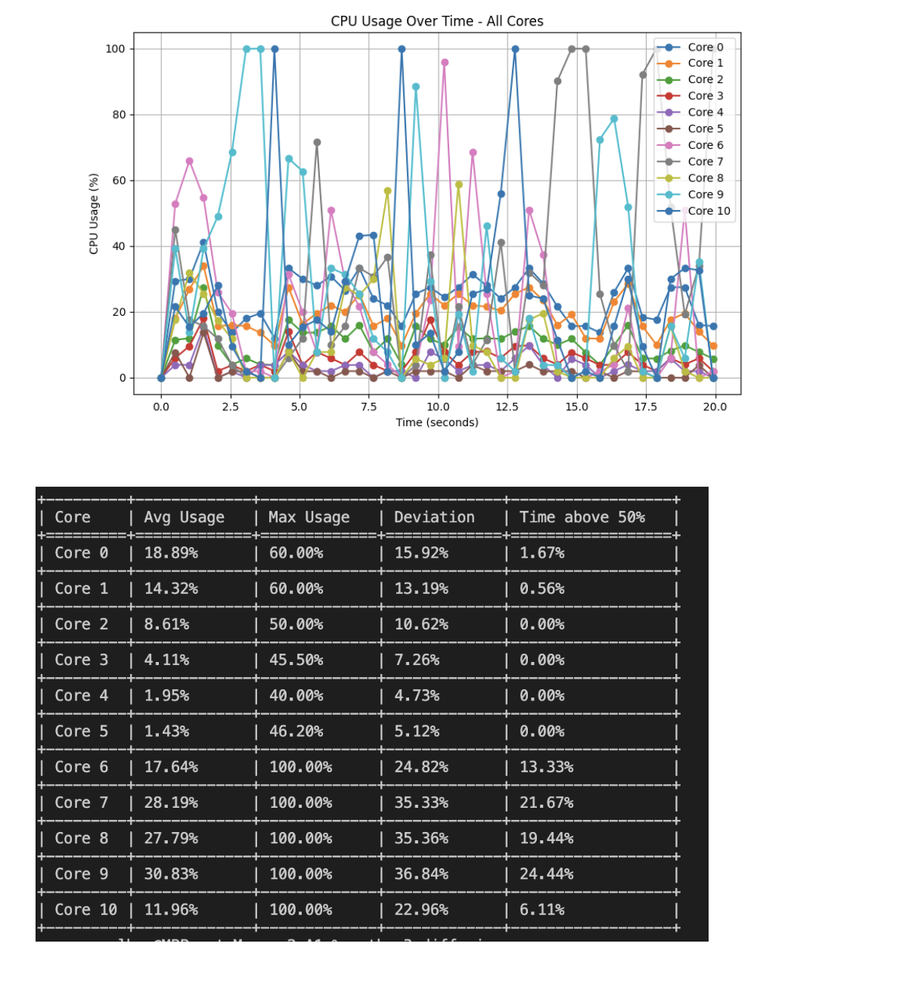

In [31]:
from IPython.display import Image
image_path = "./bonus2.png"
Image(filename=image_path)